# BSD68 Denoising Dataset

In [1]:
!pip install torchsummary


Defaulting to user installation because normal site-packages is not writeable


In [2]:
import os

current_dir = os.getcwd()
print("Current directory:", current_dir)

Current directory: /home/mkang2/Convolutional-Nearest-Neighbor/Testing


In [3]:
# Torch
import torch 
import torch.nn as nn
import torch.nn.functional as F
from torch import optim 
from torchsummary import summary
from torchvision.transforms import v2
import numpy as np


# Train + Data 
import sys 
sys.path.append('../Layers')
from Conv1d_NN import *
from Conv2d_NN import *
from Conv1d_NN_spatial import * 

from Conv2d_NN_spatial import * 
from ConvNN_CNN_Branching import *

sys.path.append('../Data')
from BSD68 import * 
from CBSD68 import *


sys.path.append('../Models')
from denoising_models import * 

sys.path.append('../Train')
from train2d import * 



import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import random

import torch 
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, datasets


In [4]:
noisybsd68 = NoisyBSD68_dataset(batch_size=32, noise_std=0.3)

In [5]:
print(len(noisybsd68.train_data))
print(len(noisybsd68.test_data))
print(len(noisybsd68.test_data[0]))
print(noisybsd68.train_data[0][0].shape)


200
40
3
torch.Size([1, 200, 200])


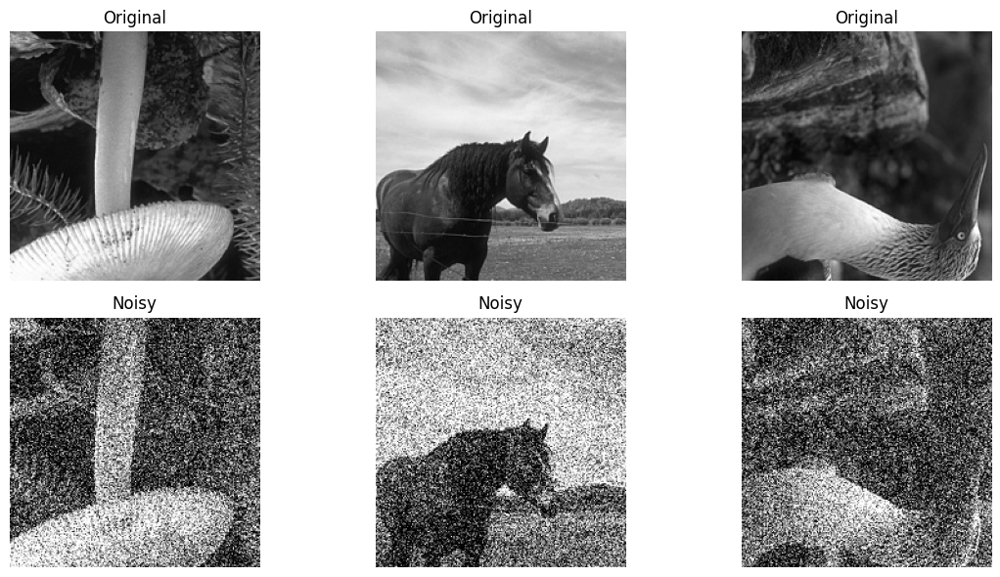

In [6]:
noisybsd68.visual(3)

### Control CNN Model



Epoch 1, Time: 0.4462127685546875, Loss: 0.13316173266087258
Epoch 2, Time: 0.16782402992248535, Loss: 0.041527177340218
Epoch 3, Time: 0.16743683815002441, Loss: 0.027321765465395793
Epoch 4, Time: 0.16515088081359863, Loss: 0.027292353766305105
Epoch 5, Time: 0.166001558303833, Loss: 0.019391645012157305
Epoch 6, Time: 0.1607062816619873, Loss: 0.01781934765832765
Epoch 7, Time: 0.16081953048706055, Loss: 0.015563794145626681
Epoch 8, Time: 0.16530156135559082, Loss: 0.01261963149798768
Epoch 9, Time: 0.16510939598083496, Loss: 0.011238437278994493
Epoch 10, Time: 0.15978002548217773, Loss: 0.010391239209898881

 Average epoch time: 0.19243428707122803
Average loss on test set: 0.009690305218100548
Average PSNR on test set: 20.195820808410645


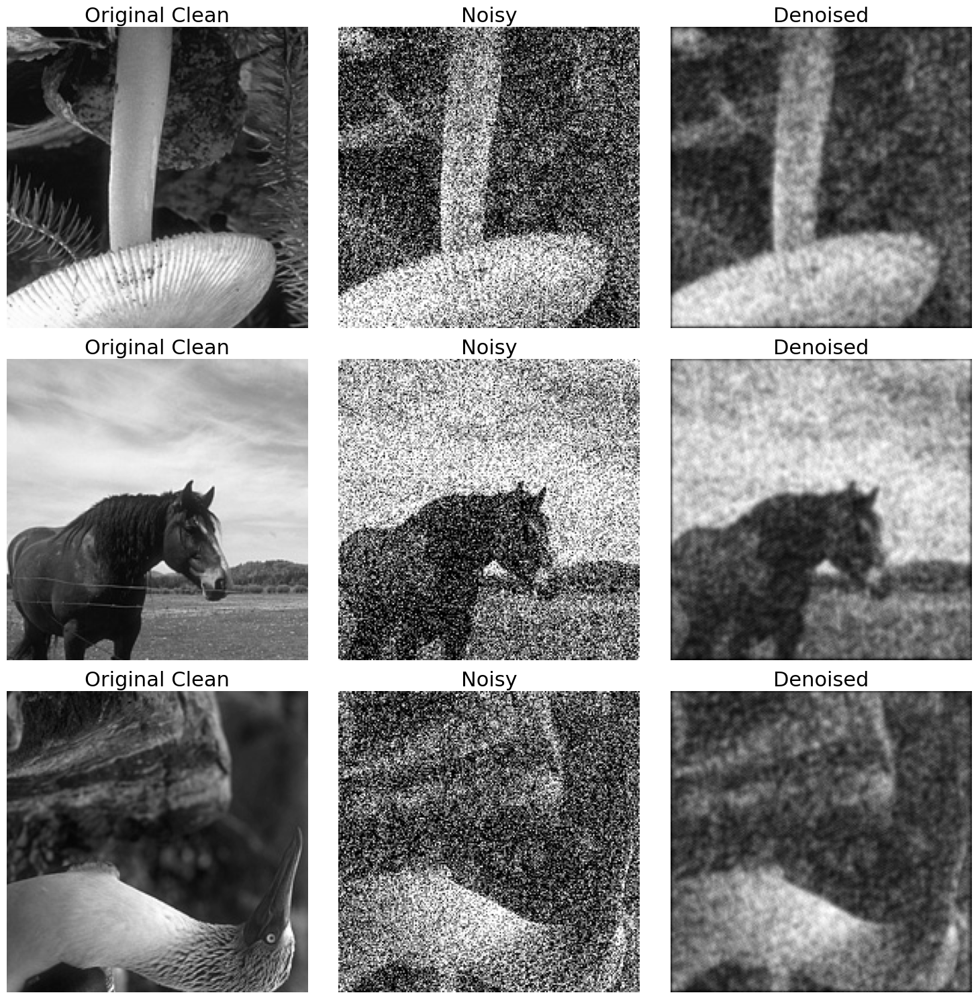

In [7]:
# CNN control model 
CNN = DenoisingCNN(in_ch=1, out_ch=1, kernel_size=3, device='cuda')

criterion = nn.MSELoss()
optimizer = optim.Adam(CNN.parameters(), lr=0.001)
num_epochs = 10
train_denoising_model(CNN, noisybsd68.train_loader, criterion, optimizer, num_epochs, device='cuda')
evaluate_denoising_accuracy(CNN, noisybsd68.test_loader, criterion, device='cuda')
evaluate_accuracy_psnr(CNN, noisybsd68.test_loader, criterion, device='cuda')


# Print out output of trained model
test_denoise_visual_BSD(CNN, noisybsd68.test_data, device='cuda')


## Branching Model

Epoch 1, Time: 0.797865629196167, Loss: 0.05662755881037031
Epoch 2, Time: 0.5813603401184082, Loss: 0.03701600698488099
Epoch 3, Time: 0.5729281902313232, Loss: 0.026589431932994297
Epoch 4, Time: 0.576030969619751, Loss: 0.02553333794432027
Epoch 5, Time: 0.5784740447998047, Loss: 0.023726637608238628
Epoch 6, Time: 0.5747232437133789, Loss: 0.02260504476726055
Epoch 7, Time: 0.571723461151123, Loss: 0.0216958826141698
Epoch 8, Time: 0.5721852779388428, Loss: 0.020649136044085026
Epoch 9, Time: 0.5795528888702393, Loss: 0.020905669778585434
Epoch 10, Time: 0.5708396434783936, Loss: 0.01990002952516079

 Average epoch time: 0.5975683689117431
Average loss on test set: 0.022194049321115017
Average PSNR on test set: 17.68080234527588


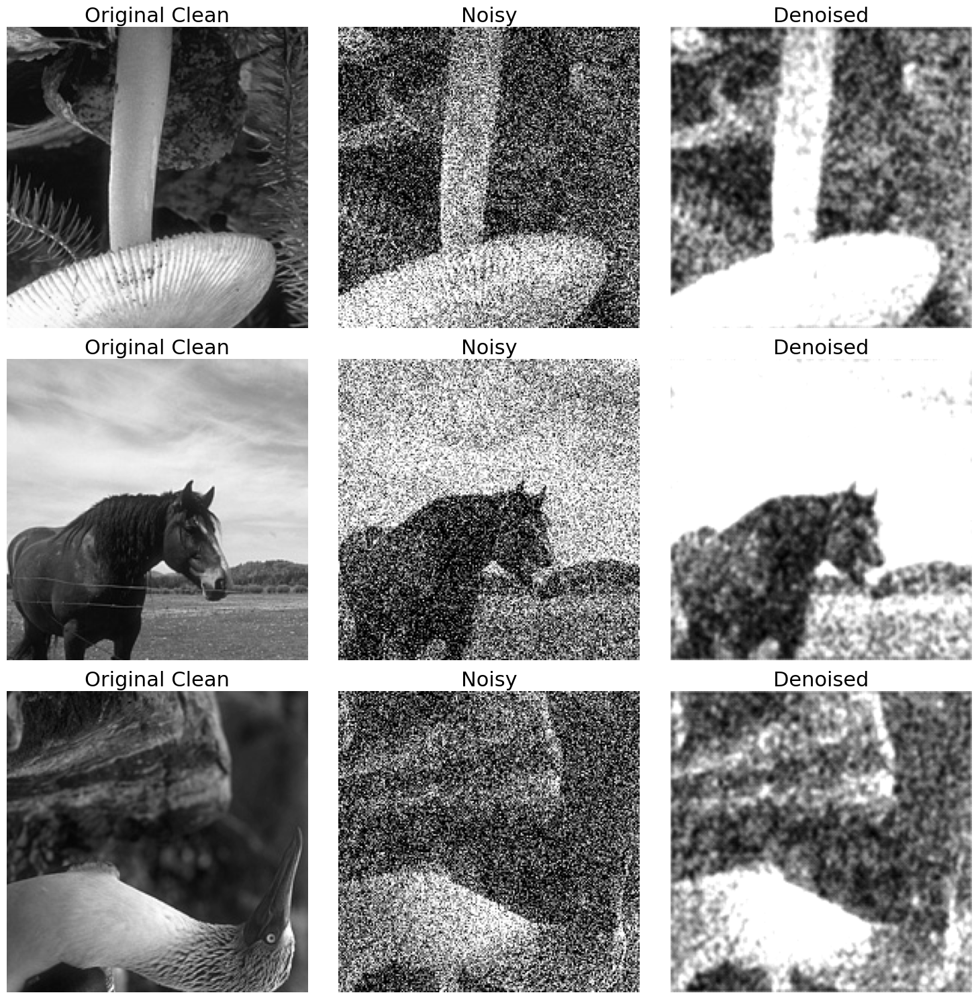

In [8]:
# Denoising Branching CNN + ConvNN Spatial, K = 9, N = 8 (64), 16:1
denoisingbranching_convNN_spatial_K_N_16_16 = DenoisingBranching_ConvNN_2D_Spatial_K_N(in_ch=1, out_ch=1, K=3, N=5, device='cuda')

criterion = nn.MSELoss()
optimizer = optim.Adam(denoisingbranching_convNN_spatial_K_N_16_16.parameters(), lr=0.001)
num_epochs = 10
train_denoising_model(denoisingbranching_convNN_spatial_K_N_16_16, noisybsd68.train_loader, criterion, optimizer, num_epochs, device='cuda')
evaluate_denoising_accuracy(denoisingbranching_convNN_spatial_K_N_16_16, noisybsd68.test_loader, criterion, device='cuda')
evaluate_accuracy_psnr(denoisingbranching_convNN_spatial_K_N_16_16, noisybsd68.test_loader, criterion, device='cuda')

# Print out output of trained model
test_denoise_visual_BSD(denoisingbranching_convNN_spatial_K_N_16_16, noisybsd68.test_data, device='cuda')



## ERROR spatial branching is not working now -> figure out why



Epoch 1, Time: 0.5619275569915771, Loss: 1.2070396116801672
Epoch 2, Time: 0.5532562732696533, Loss: 0.9171172210148403
Epoch 3, Time: 0.5546503067016602, Loss: 0.3885426563876016
Epoch 4, Time: 0.5574383735656738, Loss: 0.30708211021763937
Epoch 5, Time: 0.5579757690429688, Loss: 0.21337215389524186
Epoch 6, Time: 0.5565636157989502, Loss: 0.15410047663109644
Epoch 7, Time: 0.555103063583374, Loss: 0.10417439362832479
Epoch 8, Time: 0.5541226863861084, Loss: 0.0553476374064173
Epoch 9, Time: 0.5639081001281738, Loss: 0.02474540924387319
Epoch 10, Time: 0.5550844669342041, Loss: 0.015323762116687638

 Average epoch time: 0.5570030212402344
Average loss on test set: 0.014542851131409407
Average PSNR on test set: 18.426081657409668


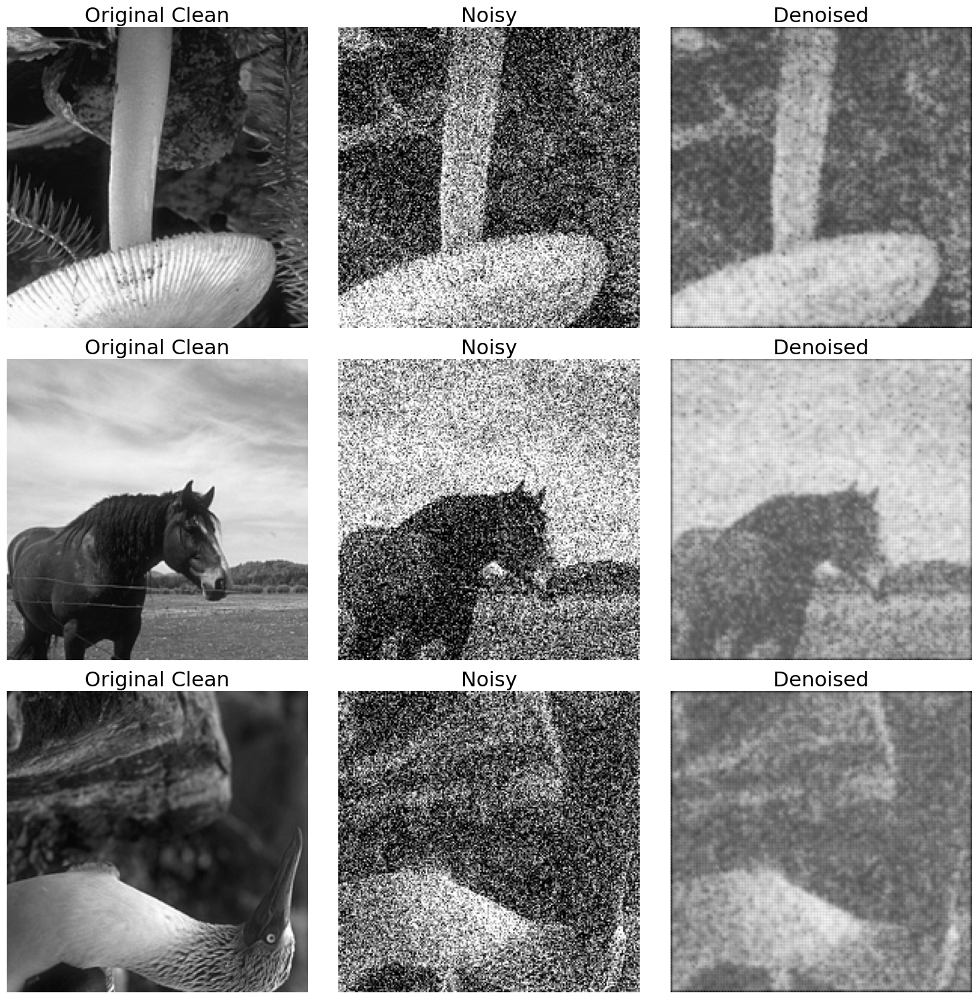

In [14]:
# Denoising Branching CNN + ConvNN Spatial, K = 9, N = 8 (64), 16:1
denoisingbranching_convNN_K_N_16_16 = DenoisingBranching_ConvNN_2D_K_N(in_ch=1, out_ch=1, K=3, N=25, device='cuda')

criterion = nn.MSELoss()
optimizer = optim.Adam(denoisingbranching_convNN_K_N_16_16.parameters(), lr=0.001)
num_epochs = 10 
train_denoising_model(denoisingbranching_convNN_K_N_16_16, noisybsd68.train_loader, criterion, optimizer, num_epochs, device='cuda')
evaluate_denoising_accuracy(denoisingbranching_convNN_K_N_16_16, noisybsd68.test_loader, criterion, device='cuda')
evaluate_accuracy_psnr(denoisingbranching_convNN_K_N_16_16, noisybsd68.test_loader, criterion, device='cuda')

# Print out output of trained model
test_denoise_visual_BSD(denoisingbranching_convNN_K_N_16_16, noisybsd68.test_data, device='cuda')



Epoch 1, Time: 0.43546557426452637, Loss: 0.11248271220496722
Epoch 2, Time: 0.4304795265197754, Loss: 0.05016959937555449
Epoch 3, Time: 0.432889461517334, Loss: 0.04097386023827961
Epoch 4, Time: 0.43088293075561523, Loss: 0.0351450081382479
Epoch 5, Time: 0.4344348907470703, Loss: 0.03068947685616357
Epoch 6, Time: 0.43403077125549316, Loss: 0.029281762295535634
Epoch 7, Time: 0.4300727844238281, Loss: 0.02693404975746359
Epoch 8, Time: 0.43066859245300293, Loss: 0.02462430457983698
Epoch 9, Time: 0.4292330741882324, Loss: 0.02353872944201742
Epoch 10, Time: 0.43410563468933105, Loss: 0.022246055038911954

 Average epoch time: 0.4322263240814209
Average loss on test set: 0.02188692521303892
Average PSNR on test set: 16.64115047454834


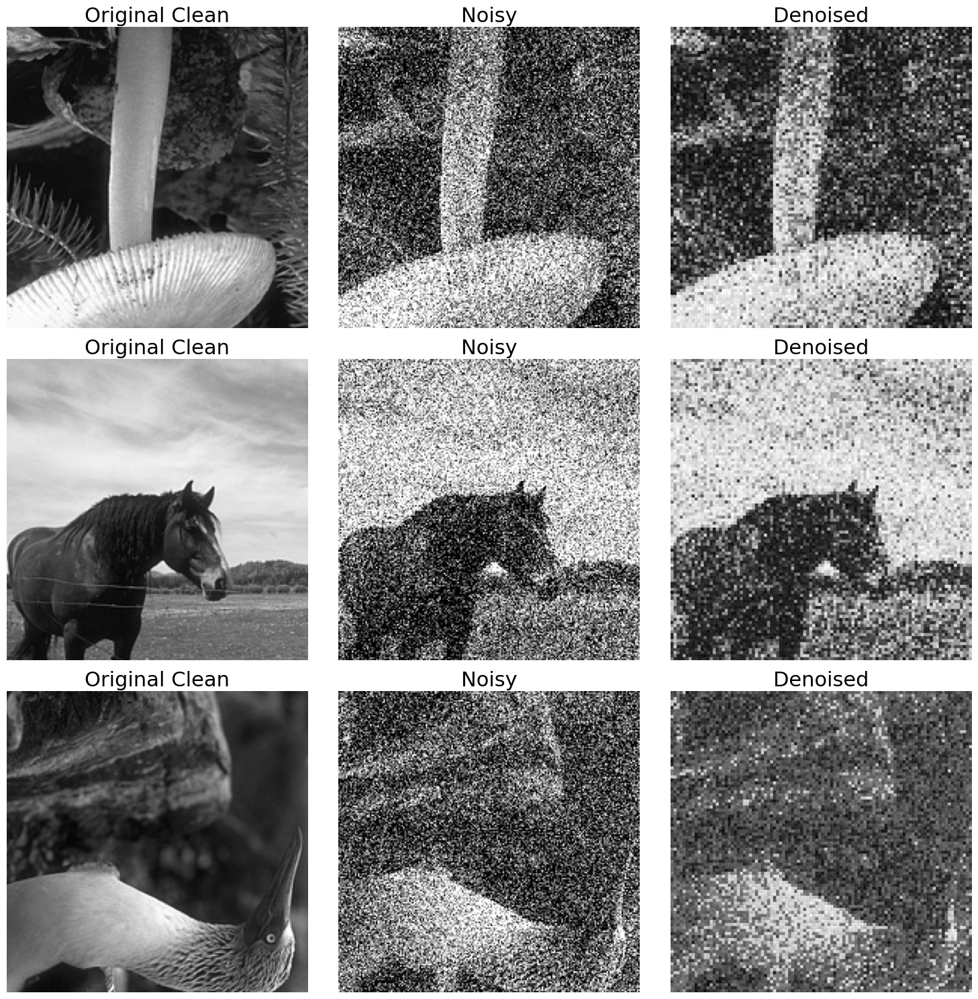

In [13]:
# ConvNN K = 3, N = 25
denoising_convNN_2D_K_N = DenoisingConvNN_2D_K_N(in_ch=1, out_ch=1, K=3, N=25, device='cuda')

criterion = nn.MSELoss()
optimizer = optim.Adam(denoising_convNN_2D_K_N.parameters(), lr=0.001)
num_epochs = 10 
train_denoising_model(denoising_convNN_2D_K_N, noisybsd68.train_loader, criterion, optimizer, num_epochs, device='cuda')
evaluate_denoising_accuracy(denoising_convNN_2D_K_N, noisybsd68.test_loader, criterion, device='cuda')
evaluate_accuracy_psnr(denoising_convNN_2D_K_N, noisybsd68.test_loader, criterion, device='cuda')

# Print out output of trained model
test_denoise_visual_BSD(denoising_convNN_2D_K_N, noisybsd68.test_data, device='cuda')

